<a href="https://colab.research.google.com/github/miya498/petbottle_detection/blob/master/YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **YOLOv5を用いたペットボトルごみ検証モデル**

**＜実行環境＞**

実行環境は、無料版colaboratoryを使用していたが、学習の段階でGPUの使用制限を頻繫に受けてしまった。そのため、途中からはcolaboratoryProにアップグレードしている。また、学習用データセットの保存、モデルの保存、出力結果など全てをGoogleDrive上で行っており、Drive容量も20GBから100GBのものに変更。

**＜学習用データセット＞**

YOLOの学習において画像以外にアノテーションデータも必要となる。アノテーションデータは「LabelImg」というアノテーション専用のソフトを用いて行った。

*[Github]：https://github.com/tzutalin/labelImg
学習データは自ら収集した画像とインターネット上の画像を合わせて267枚用意した。
(水増しなしのデータ)

またこの画像データを縮小し回転した画像をプログラムで出力し、1枚の画像から4枚の水増し画像を得た。これによって267×5=1335枚のデータセットを別に用意した。(水増しありのデータセット)

**＜学習済みモデル＞**

driveからダウンロードしてください

*[yolov5x_pet_1000.pt]:水増しなしのデータセットで学習(epoch=1000)

https://drive.google.com/file/d/1du4SX3T50VlTcf9JkwtOt0nju9fVRxSn/view?usp=drive_link

*[yolov5x_pet_250.pt]:水増しありのデータセットで学習(epoch=250)

https://drive.google.com/file/d/1D7XN7xJSYg-PbS9_g3bIgLl3iTR2Fyi_/view?usp=drive_link

*参考:https://qiita.com/PoodleMaster/items/5f2cc3248c03b03821b8

#YOLOv5をGoogle Driveにダウンロード

In [1]:
#googledriveに接続
import google.colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#clone
%cd /content/drive/MyDrive/
#YOLOv5をインストール
!git clone https://github.com/ultralytics/yolov5

/content/drive/MyDrive
fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
#必要なライブラリのインポート
%cd yolov5/
!pip install -r requirements.txt

/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.0/715.0 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.5 MB/s eta 0:00:00


#学習データの準備

・google drive上に「Petbottle」フォルダを用意し、その中に「train」「val」「petbottle.yaml」のフォルダを作成する。

petbottle.yamlはgithubからダウンロード

またtrain,valファイルにはclass.txtと画像データとそれに対応するアノテーションデータを格納する。

*[Github]:https://github.com/miya498/petbottle_detection.git





#学習済みモデルを使った推論デモ

##学習ログの可視化(Tensorboard)

In [ ]:
# TensorBoard を起動する
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/yolov5/runs"

<IPython.core.display.Javascript object>

##学習開始

--dataにyamlファイルのパス、--weightsにyolov5x.ptを指定
オプションの参考:
https://qiita.com/shinya_sun_sun/items/8c368f3024bf5b0d14aa

In [ ]:
%cd /content/drive/MyDrive/yolov5
# Train YOLOv5x
#水増しなし　/Petbottle/petbottle.yaml
#水増しあり  /Petbottle_fake/petbottle_fake.yaml
!python train.py --imgsz 640 --batch 16 --epochs  250 --data '/content/drive/MyDrive/Petbottle_fake/petbottle_fake.yaml' --name petbottlev5x_1000 --weights yolov5x.pt

/content/drive/MyDrive/yolov5
2023-12-28 15:05:59.240555: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-28 15:05:59.240613: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-28 15:05:59.242412: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/Petbottle_fake/petbottle_fake.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=

#任意の画像で確認

--weights 学習済みモデルのパス
--source 検出させたい画像のパス

##水増ししたデータセットで学習させたモデル

In [ ]:
!python detect.py --weights /content/drive/MyDrive/yolov5/runs/train/fa_pet_v5x_250/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/yolov5/data/images/sample05.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/fa_pet_v5x_250/weights/best.pt'], source=/content/drive/MyDrive/yolov5/data/images/sample05.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-231-gc2f131a Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86186872 parameters, 0 gradients, 203.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/yolov5/data/images/sample05.jpg: 320x416 2 caps, 2 labels, 3 petbottles, 54.9ms
Speed: 0.5ms pre-process, 54.9ms inference, 749.9ms NMS per image at shape (1, 3, 416, 416)
Result

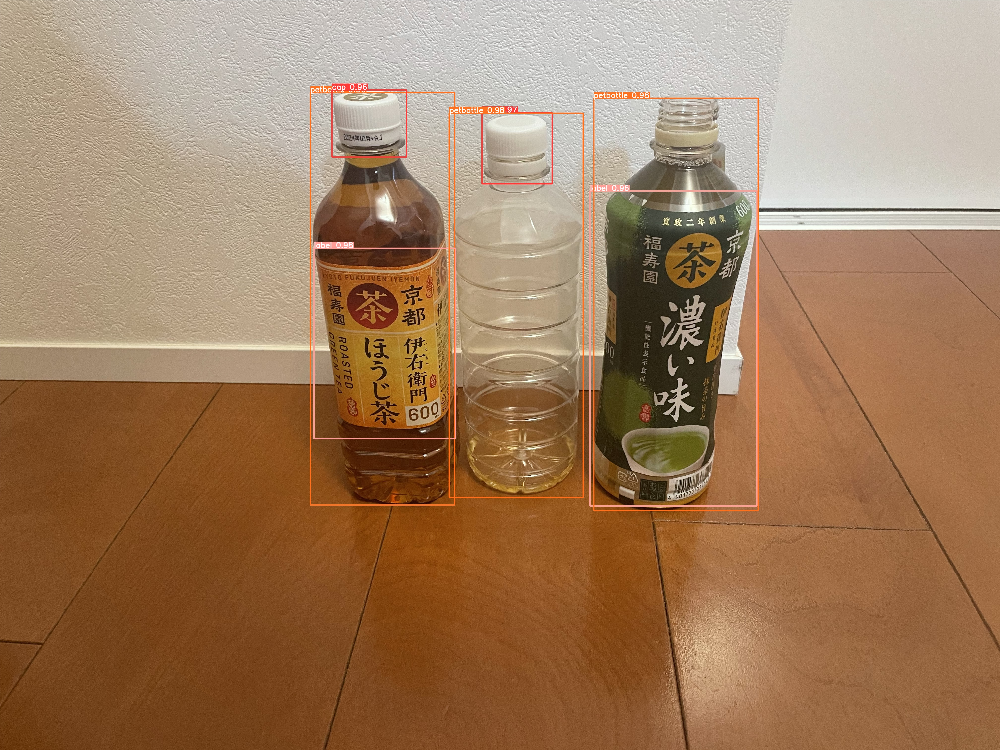

In [ ]:
from IPython.display import Image
#()の中にパスを入力
Image("/content/drive/MyDrive/yolov5/runs/detect/exp16/sample05.jpg")

##水増しなしのデータセットで学習させたモデル

In [ ]:
!python detect.py --weights /content/drive/MyDrive/yolov5/runs/train/nf_pet_v5x_1000/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/yolov5/data/images/sample05.jpg

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/nf_pet_v5x_1000/weights/best.pt'], source=/content/drive/MyDrive/yolov5/data/images/sample05.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-231-gc2f131a Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 322 layers, 86186872 parameters, 0 gradients, 203.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/yolov5/data/images/sample05.jpg: 320x416 2 caps, 2 labels, 3 petbottles, 98.6ms
Speed: 0.6ms pre-process, 98.6ms inference, 882.0ms NMS per image at shape (1, 3, 416, 416)
Resul

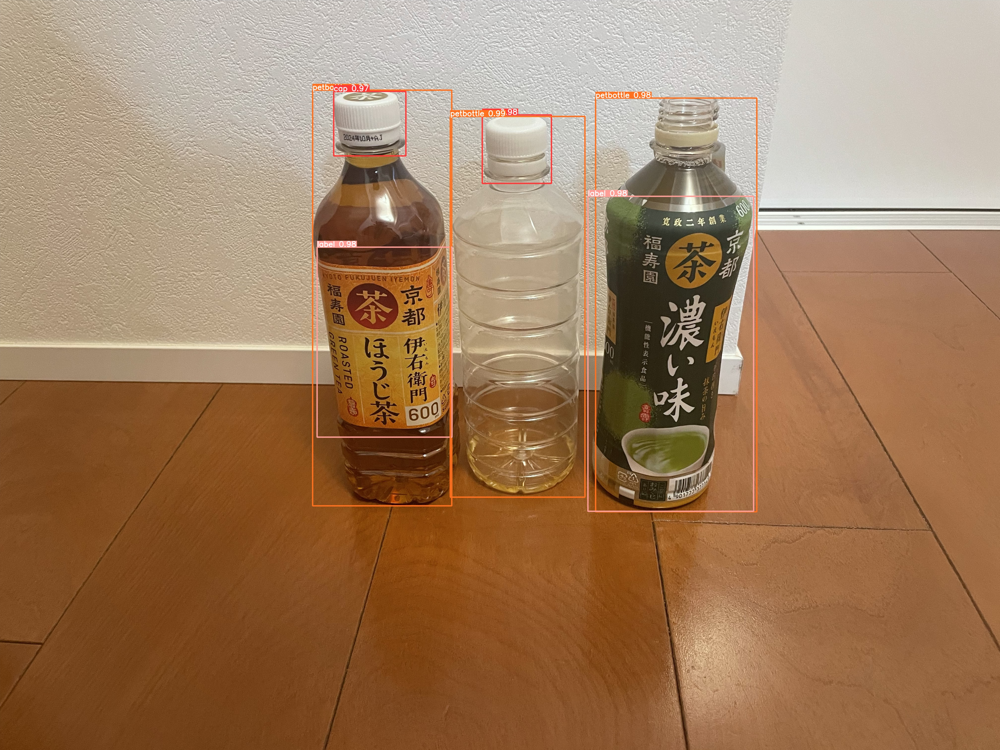

In [ ]:
from IPython.display import Image
#()の中にパスを入力
Image("/content/drive/MyDrive/yolov5/runs/detect/exp17/sample05.jpg")

#任意の動画

In [ ]:
!python detect.py --source '/content/drive/MyDrive/yolov5/data/images/IMG_3116.MOV' --weights /content/drive/MyDrive/yolov5/runs/train/fa_pet_v5x_250/weights/best.pt

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/fa_pet_v5x_250/weights/best.pt'], source=/content/drive/MyDrive/yolov5/data/images/IMG_3116.MOV, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-231-gc2f131a Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 322 layers, 86186872 parameters, 0 gradients, 203.8 GFLOPs
video 1/1 (1/520) /content/drive/MyDrive/yolov5/data/images/IMG_3116.MOV: 384x640 (no detections), 248.7ms
video 1/1 (2/520) /content/drive/MyDrive/yolov5/data/images/IMG_3116.MOV: 384x640 (no detections), 229.5ms
video 1/1 (3/520) /content/drive/MyDrive/yolov5/data/images/IM

##5分10秒の動画で物体検出(13分28秒)

In [ ]:
!python detect.py --source 'https://www.youtube.com/watch?v=hxzYODEvE-Q' --weights /content/drive/MyDrive/yolov5/runs/train/petbottle_v5x/weights/best.pt

ストリーミング出力は最後の 5000 行に切り捨てられました。
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.3ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.3ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.3ms
0: 384x640 1 cap, 12.6ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.0ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.0ms
0: 384x640 1 cap, 12.0ms
0: 384x640 1 cap, 11.9ms
0: 384x640 1 cap, 12.3ms
0: 384x640 1 cap, 12.6ms
0: 384x640 1 cap, 